In [ ]:
# Goal: Analyze music data to see how successful models are at predicting song danceability
# Predictors: instrumentalness, tempo, temporal_features0-223
# Data Source: https://github.com/mdeff/fma 
#    Subset of data with 13,133 songs
#
# Part 1: Data Cleaning, Preparation, Exploration
# Date last updated: 12/21/2023
# Author: Kay Rubio

In [21]:
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

In [3]:
# Import data
df = pd.read_csv("./echonest_cleaner.csv")

In [4]:
# Check data
df.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,album_date,...,temporal_features214,temporal_features215,temporal_features216,temporal_features217,temporal_features218,temporal_features219,temporal_features220,temporal_features221,temporal_features222,temporal_features223
0,2,0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922,0.576661,NaN,...,-1.992303,6.805694,0.233070,0.192880,0.027455,0.06408,3.67696,3.61288,13.316690,262.929749
1,3,0.374408,0.528643,0.817461,0.001851,0.105880,0.461818,126.957,0.269240,NaN,...,-1.582331,8.889308,0.258464,0.220905,0.081368,0.06413,6.08277,6.01864,16.673548,325.581085
2,5,0.043567,0.745566,0.701470,0.000697,0.373143,0.124595,100.260,0.621661,NaN,...,-2.288358,11.527109,0.256821,0.237820,0.060122,0.06014,5.92649,5.86635,16.013849,356.755737
3,10,0.951670,0.658179,0.924525,0.965427,0.115474,0.032985,111.562,0.963590,3/11/08,...,-3.662988,21.508228,0.283352,0.267070,0.125704,0.08082,8.41401,8.33319,21.317064,483.403809
4,134,0.452217,0.513238,0.560410,0.019443,0.096567,0.525519,114.290,0.894072,NaN,...,-1.452696,2.356398,0.234686,0.199550,0.149332,0.06440,11.26707,11.20267,26.454180,751.147705


In [5]:
# Drop columns that I'm not planning to use as predictors
drop_cols = ['track_id', 'acousticness', 'energy', 'liveness', 'speechiness', 'valence', 'album_date', 'album_name', 'artist_latitude', 'artist_location', 'artist_longitude', 'artist_name', 'release', 'artist_discovery_rank', 'artist_familiarity_rank', 'artist_hotttnesss_rank', 'song_currency_rank', 'song_hotttnesss_rank', 'artist_discovery', 'artist_familiarity', 'artist_hotttnesss', 'song_currency', 'song_hotttnesss']
df.drop(drop_cols, axis=1, inplace=True) 

In [6]:
# Check missingness
print('missing in danceability: {}'.format(df['danceability'].isnull().sum()))
print('missing in instrumentalness: {}'.format(df['instrumentalness'].isnull().sum()))
print('missing in tempo: {}'.format(df['tempo'].isnull().sum()))
print('missing in temporal_features0: {}'.format(df['temporal_features0'].isnull().sum())) # Just checking first of the temporal_features

missing in danceability: 0
missing in instrumentalness: 0
missing in tempo: 0
missing in temporal_features0: 0


In [7]:
# Check if these columns are entirely numeric:
print('danceability contains string: {}'.format(any(df['danceability'].apply(lambda x: isinstance(x, str)))))
print('instrumentalness contains string: {}'.format(any(df['instrumentalness'].apply(lambda x: isinstance(x, str)))))
print('tempo contains string: {}'.format(any(df['tempo'].apply(lambda x: isinstance(x, str)))))
print('temporal_features0 contains string: {}'.format(any(df['temporal_features0'].apply(lambda x: isinstance(x, str))))) # Just checking first of the temporal_features

danceability contains string: False
instrumentalness contains string: False
tempo contains string: False
temporal_features0 contains string: False


In [8]:
# Check min, max, and other descriptive stats for anything out of range
df.describe()

,danceability,instrumentalness,tempo,temporal_features0,temporal_features1,temporal_features2,temporal_features3,temporal_features4,temporal_features5,temporal_features6,...,temporal_features214,temporal_features215,temporal_features216,temporal_features217,temporal_features218,temporal_features219,temporal_features220,temporal_features221,temporal_features222,temporal_features223
count,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,...,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000,13129.000000
mean,0.487290,0.640536,123.080061,0.448356,0.435871,0.365206,0.306067,0.365518,0.325732,0.332409,...,-1.966002,10.745951,0.308984,0.255381,0.163876,0.068526,4.183428,4.114902,7.605432,138.932366
std,0.190148,0.361430,35.015137,0.164809,0.166433,0.132484,0.118799,0.139493,0.124826,0.124180,...,1.708499,20.053146,0.140164,0.083731,3.484144,0.010930,4.967481,4.967004,6.444884,225.584951
min,0.051307,0.000000,12.753000,0.022635,0.020016,0.015092,0.014307,0.032791,0.014088,0.011858,...,-17.966162,-1.867880,0.129023,0.098280,0.000518,0.060000,0.322180,0.224580,-3.566834,-1.687834
25%,0.344759,0.323466,95.967000,0.332359,0.316432,0.275173,0.224428,0.268218,0.238666,0.246155,...,-2.587326,1.229409,0.242371,0.208750,0.021321,0.063080,1.817050,1.749660,2.866906,15.565598
50%,0.485635,0.838134,120.057000,0.445567,0.432219,0.355969,0.297733,0.352954,0.318924,0.325449,...,-1.565120,4.355214,0.286014,0.242745,0.042146,0.064490,3.094060,3.026260,5.502340,55.874954
75%,0.629094,0.918244,145.318000,0.560145,0.551585,0.442907,0.376437,0.448581,0.401922,0.408836,...,-0.875471,11.407599,0.339086,0.285305,0.087516,0.070070,5.147530,5.079770,10.597994,175.938553
max,0.968645,0.998016,251.072000,0.998426,0.985372,0.996535,0.990182,0.967532,0.950671,0.967767,...,1.663782,423.621094,5.211423,1.680570,375.744781,0.342000,226.326767,226.244080,67.041878,4790.696777


<Axes: ylabel='Frequency'>

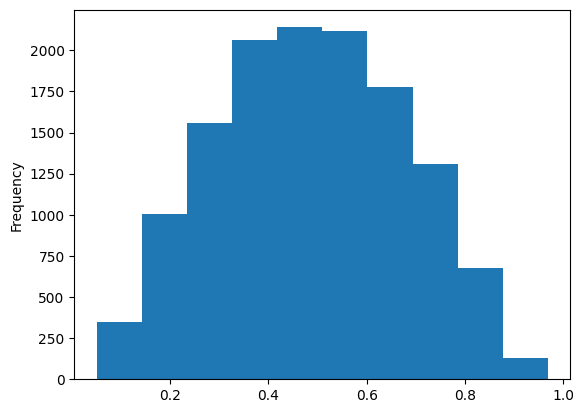

In [9]:
# Since the baseline model will be multivariate linear regression, lets check the assumptions behind
# that analysis, which is helpful to better understand the relationships in the data in general
#
# 1. Sample Size: recommended to have at least 15 records per predictor, OR 50 records + 8 per predictor
#    226 predictors, and 9846 records in training data = ALL SET
#
# 2. Independence of Observations
#    Since individual songs can be grouped by artist, this may be violated. But we proceed anyway...
#
# 3. Univariate normality
df['danceability'].plot(kind = 'hist') 

<Axes: ylabel='Frequency'>

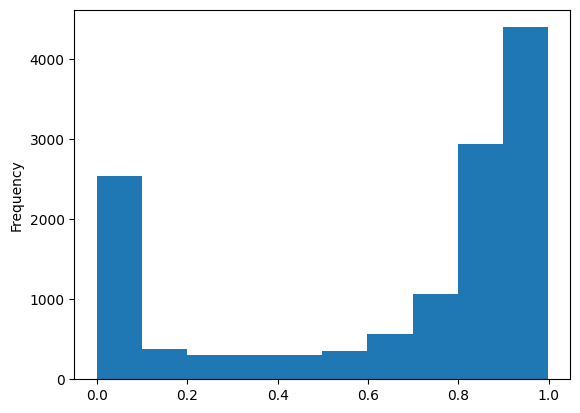

In [10]:
df['instrumentalness'].plot(kind = 'hist') 

<Axes: ylabel='Frequency'>

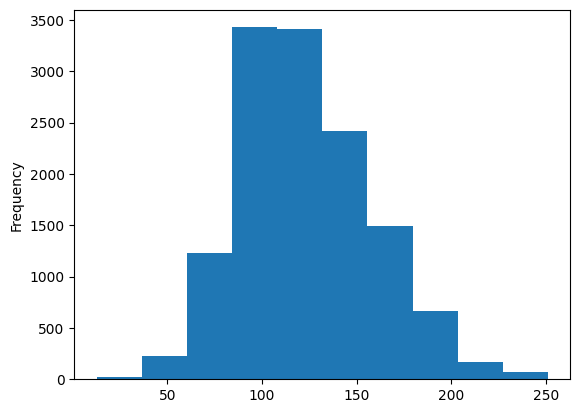

In [11]:
df['tempo'].plot(kind = 'hist') 

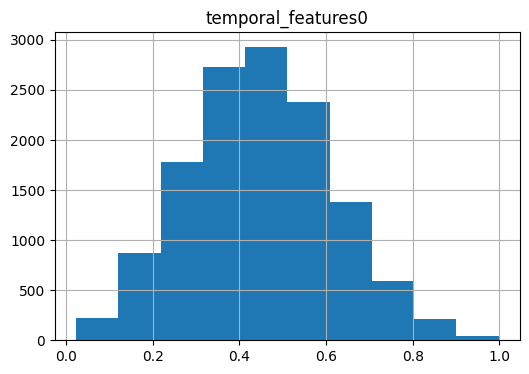

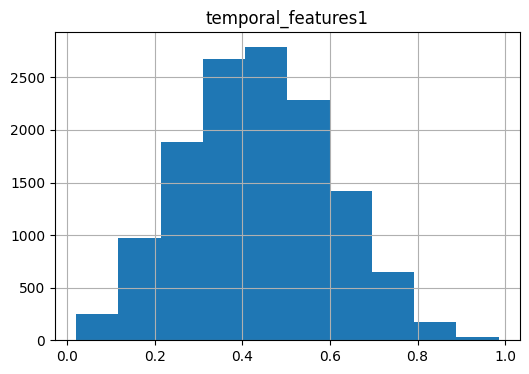

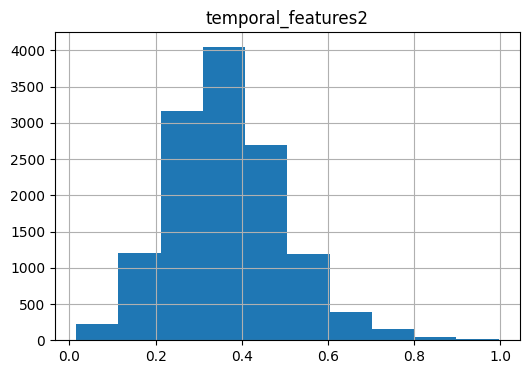

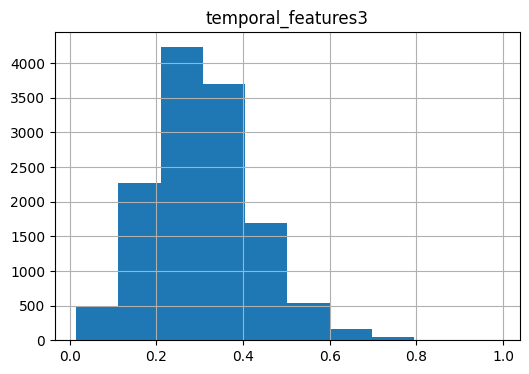

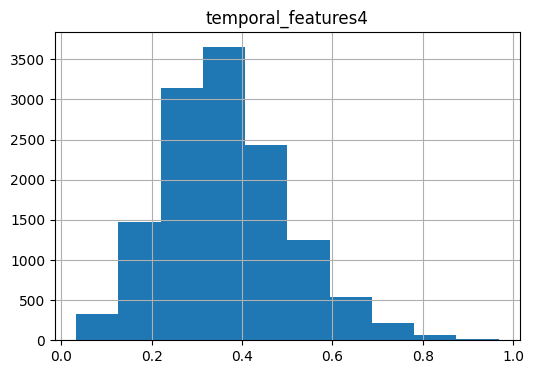

...

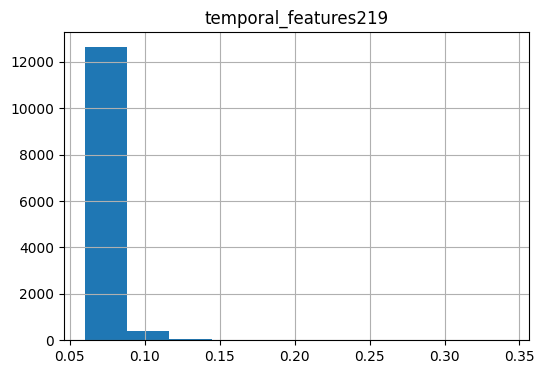

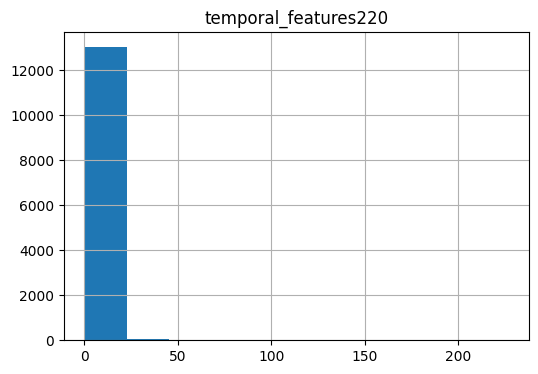

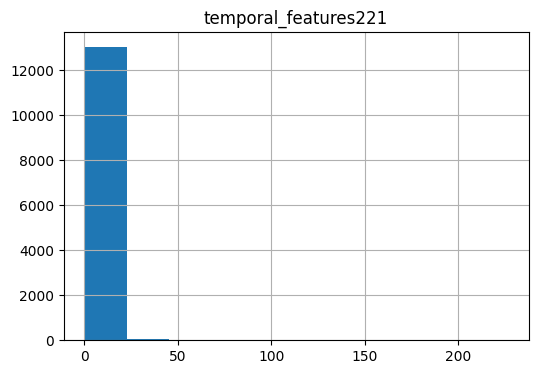

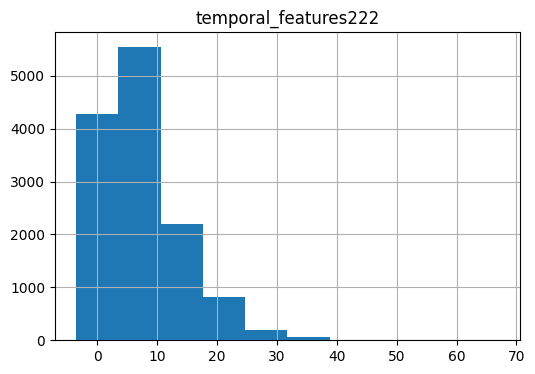

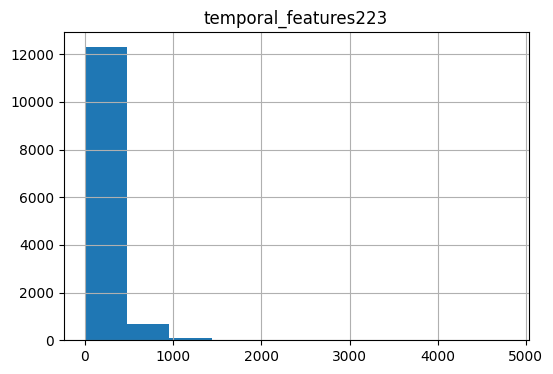

In [12]:
# Plot histograms for all temporal_features columns
for i in range(224):
    col_name = f'temporal_features{i}'
    df[col_name].hist(bins=10, figsize=(6, 4))
    plt.title(col_name)
    plt.show()

In [ ]:
# Results of checking univariate normality: 
# Based on the very abnormal distribution (some with no variance at all) of some temporal_features, 
# Will plan to cut these ones out of datasets for regression:
# 36-71, 74-75, 84-95, 120-132, 177-178, 180-191, 194-195, 199-207, 210-211, 215-221, 223
# Additionally instrumentalness is very much NOT normally distributed. Will turn this into a binary categorical variable
# for regression model only with a cutoff of 0.5

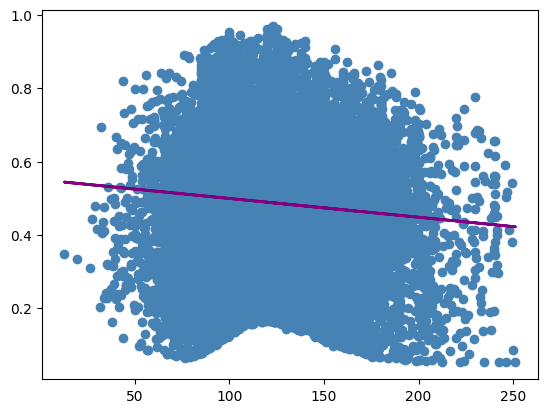

In [13]:
# 4. Linear relationships and homoscedasticity between each predictor and the outcome danceability
# Will check these assumptions using scatterplots with a best fit line
# find line of best fit
a, b = np.polyfit(df['tempo'], df['danceability'], 1)

#add points to plot
plt.scatter(df['tempo'], df['danceability'], color='steelblue')

#add line of best fit to plot
plt.plot(df['tempo'], a*df['tempo']+b, color='purple', linewidth=2)

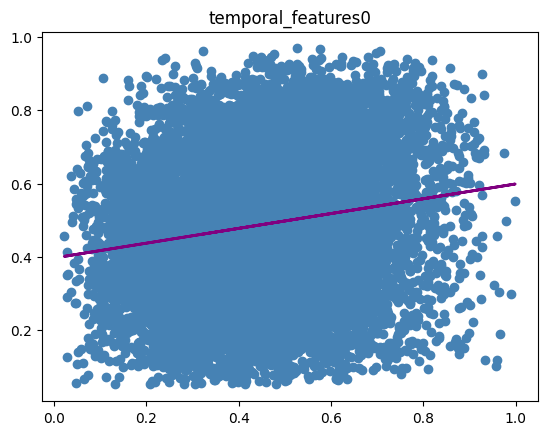

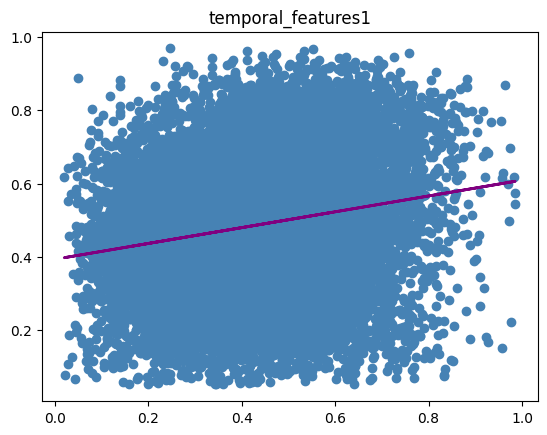

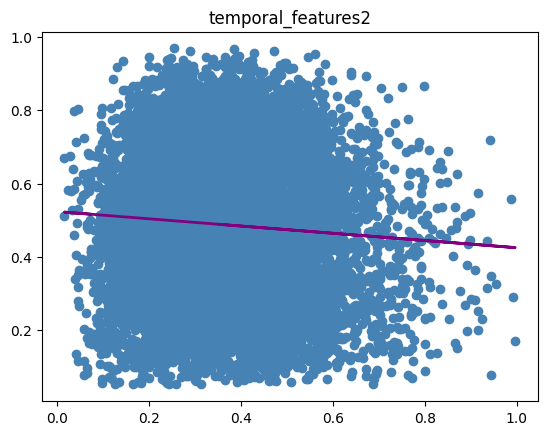

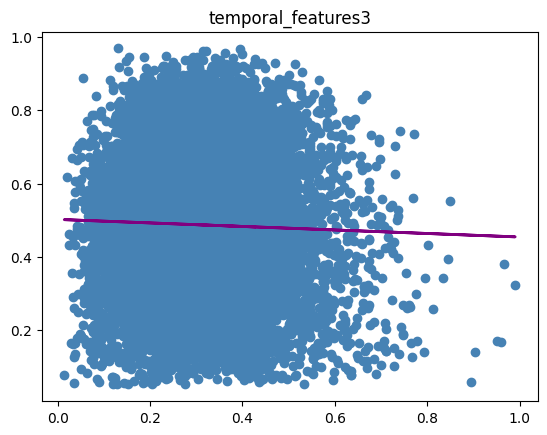

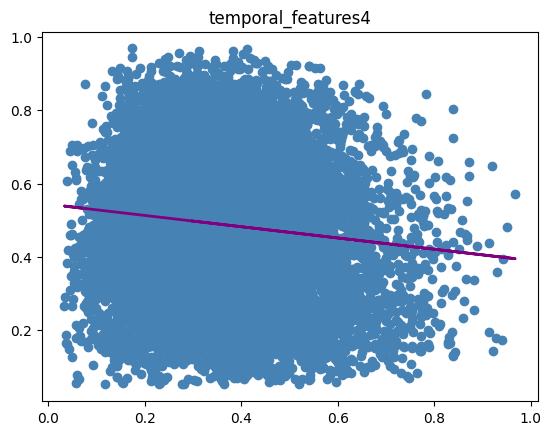

...

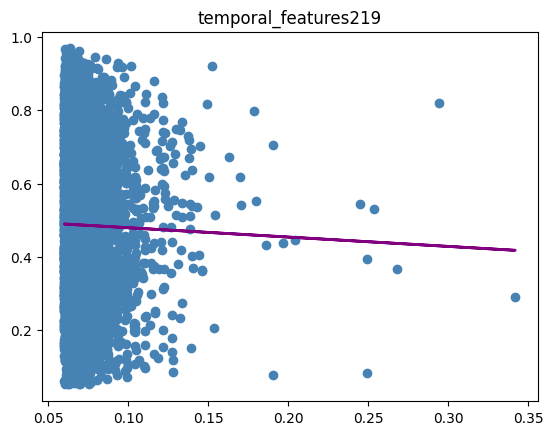

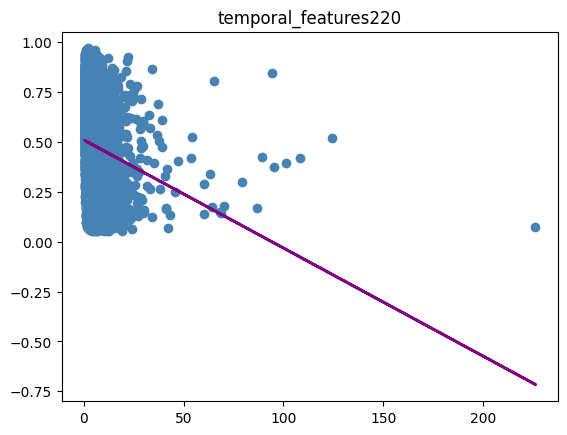

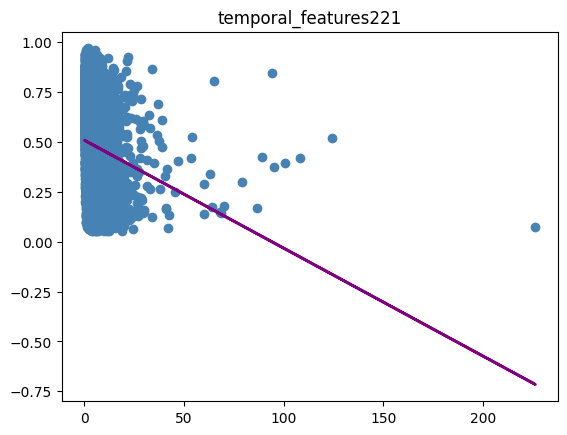

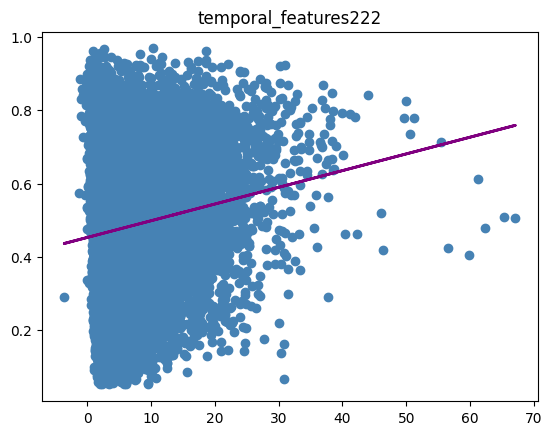

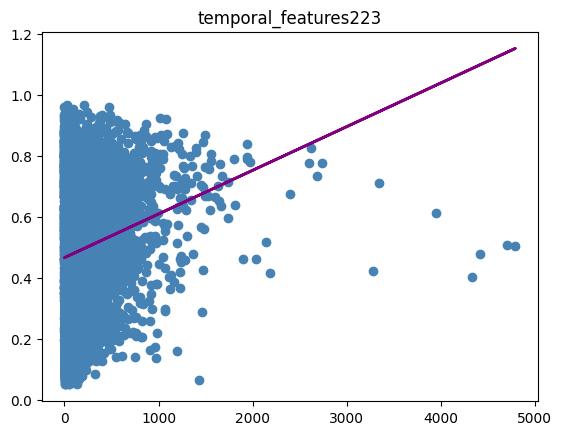

In [14]:
# Plot scatterplots with lines of best fit for all temporal_features columns with danceability
for i in range(224):
    col_name = f'temporal_features{i}'
    #find line of best fit
    a, b = np.polyfit(df[col_name], df['danceability'], 1)
    #add points to plot
    plt.scatter(df[col_name], df['danceability'], color='steelblue')
    #add line of best fit to plot
    plt.plot(df[col_name], a*df[col_name]+b, color='purple', linewidth=2)
    plt.title(col_name)
    plt.show()

In [ ]:
# Results of checking linear relationships and homoscedasticity
# Some of these look OK, but some show extreme heterscedasticity with extreme multivariate outliers.
# When a linear best fit line is applied, many show flat lines, indicating little linear correlation between
# the predictor and the outcome. Many of these predictors would not be useful in a regression model, but may be OK
# to leave in other models that allow non-linear relationships

In [15]:
# 5. Correlations with outcome, and multicolinearity
#    Since there isn't a lot of documentation on these "temporal_features" in the data, lets do some stats to see
#    the strenght (if any) linear relationships with danceability, and also check for any multicolinearity > -.9 
#    between predictors that would violate linear regression
# Create the correlation matrix
correlation_matrix = df.corr()

# Create a styled correlation table with color highlighting
styled_corr_table = correlation_matrix.style.background_gradient(cmap='coolwarm')

# Display the styled correlation table
styled_corr_table

In [ ]:
# Result: Some of the temporal features are highly correlated with each other.
# Relationships between most temporal_features and danceability are pretty weak, but some have correlations that 
# indicate a useful linear relationship for a regression model
#
# Using a cutoff of correlations >0.3 lets keep these in the regression data model #1
columns_to_keep = ['temporal_features98', 'temporal_features99', 'temporal_features101', 'temporal_features110', 'temporal_features111', 'temporal_features113', 'temporal_features123', 'temporal_features125', 'temporal_features127', 'temporal_features129', 'temporal_features130', 'temporal_features134', 'temporal_features139', 'temporal_features141', 'temporal_features149', 'temporal_features154', 'temporal_features161', 'temporal_features163', 'temporal_features165', 'temporal_features166', 'temporal_features183', 'temporal_features185', 'temporal_features200', 'temporal_features201', 'temporal_features214', 'temporal_features216', 'temporal_features217']
# Of these, some are very not normally dist: 123, 125, 127, 129, 130, 183, 185, 200, 201, 216, 217
# Of these, some are pretty far from homoscedasticity or have a lot of multivariate outliers:
#   123, 125, 127, 129, 183, 185, 200, 201, 214, 216, 217
# Leaving them in for now, but can try a regression model without them in the future
x_train_reg2 = x_train[columns_to_keep]
x_test_reg2 = x_test[columns_to_keep]
x_train_reg2.head()

In [ ]:
# Given this data exploration the following decisions were made
# 1. For regression model, make instrumentalness binary with cutoff of 0.5. Include if there's some relationship between
#    the binary categories and danceability
# 2. Try a regression model with only temporal_features that have a correlation with danceability of at least 0.3
# 3. Try a second regression model that further cuts out temporal_features that have very poor homoscedasticity and/or multivariate outliers
# 4. The other models (random forest, multilayer perceptron, boosting) may be able to handle this messy data, so leave in the noise. But
#    if results are poor, we can also try these models on the trimmed data

<Axes: ylabel='Frequency'>

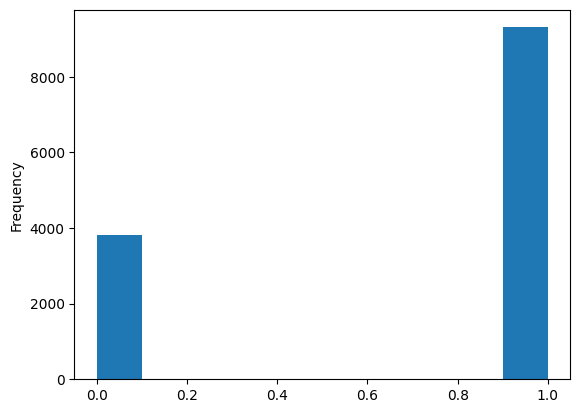

In [31]:
# Turning instrumentalness into a binary categorical variable for regression model
df['instrumentalness2'] = np.where(df['instrumentalness'] > 0.5, 1, 0)
df['instrumentalness2'].plot(kind = 'hist')

In [32]:
# Check if instrumentalness2 as a binary variable has much of a relationship with the outcome danceability?
# get mean, median, min, and max of danceability grouped by instrumentalness2
df.groupby('instrumentalness2')[['danceability']].agg(['mean', 'median', 'min', 'max'])

danceability                              
                          mean    median       min       max
instrumentalness2                                           
0                     0.514582  0.518747  0.051636  0.968645
1                     0.476096  0.468841  0.051307  0.966883

In [ ]:
# Instrumental songs are slightly more danceable than non-instrumental songs, but the means are very similar.
# Could do some significance tests on here, but given how close the means are, probably safe to assume that
# instrumentalness wouldn't be a helpful predictor in a regression model. Will leave out of regression-specific datasets

In [16]:
# split the df into x and y
y = df[['danceability']] # get the outcome variable into a new df called y
y.head() # check it

,danceability
0,0.675894
1,0.528643
2,0.745566
3,0.658179
4,0.513238


In [17]:
predictors = list(df.columns) # get a list of columns
predictors.remove('danceability') # remove the outcome
predictors # check it
x = df[predictors] # x is the df with only predictor columns
x.head() # check it

,instrumentalness,tempo,temporal_features0,temporal_features1,temporal_features2,temporal_features3,temporal_features4,temporal_features5,temporal_features6,temporal_features7,...,temporal_features214,temporal_features215,temporal_features216,temporal_features217,temporal_features218,temporal_features219,temporal_features220,temporal_features221,temporal_features222,temporal_features223
0,0.010628,165.922,0.877233,0.588911,0.354243,0.295090,0.298413,0.309430,0.304496,0.334579,...,-1.992303,6.805694,0.233070,0.192880,0.027455,0.06408,3.67696,3.61288,13.316690,262.929749
1,0.001851,126.957,0.534429,0.537414,0.443299,0.390879,0.344573,0.366448,0.419455,0.747766,...,-1.582331,8.889308,0.258464,0.220905,0.081368,0.06413,6.08277,6.01864,16.673548,325.581085
2,0.000697,100.260,0.548093,0.720192,0.389257,0.344934,0.361300,0.402543,0.434044,0.388137,...,-2.288358,11.527109,0.256821,0.237820,0.060122,0.06014,5.92649,5.86635,16.013849,356.755737
3,0.965427,111.562,0.311404,0.711402,0.321914,0.500601,0.250963,0.321316,0.734250,0.325188,...,-3.662988,21.508228,0.283352,0.267070,0.125704,0.08082,8.41401,8.33319,21.317064,483.403809
4,0.019443,114.290,0.610849,0.569169,0.428494,0.345796,0.376920,0.460590,0.401371,0.449900,...,-1.452696,2.356398,0.234686,0.199550,0.149332,0.06440,11.26707,11.20267,26.454180,751.147705


In [22]:
# Split into default 25% test and 75% training
# add a seed to the randomizer so the split will be consistent/reproducible
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = 1234)

In [23]:
# check number of rows, then columns
x_train.shape
x_test.shape
y_train.shape
y_test.shape

(3283, 1)

In [33]:
# For regression model #1 keep predictors that have a correlation with danceability of at least 0.3
columns_to_keep = ['temporal_features98', 'temporal_features99', 'temporal_features101', 'temporal_features110', 'temporal_features111', 'temporal_features113', 'temporal_features123', 'temporal_features125', 'temporal_features127', 'temporal_features129', 'temporal_features130', 'temporal_features134', 'temporal_features139', 'temporal_features141', 'temporal_features149', 'temporal_features154', 'temporal_features161', 'temporal_features163', 'temporal_features165', 'temporal_features166', 'temporal_features183', 'temporal_features185', 'temporal_features200', 'temporal_features201', 'temporal_features214', 'temporal_features216', 'temporal_features217']
x_train_reg2 = x_train[columns_to_keep]
x_test_reg2 = x_test[columns_to_keep]
x_train_reg2.head()

,temporal_features98,temporal_features99,temporal_features101,temporal_features110,temporal_features111,temporal_features113,temporal_features123,temporal_features125,temporal_features127,temporal_features129,...,temporal_features163,temporal_features165,temporal_features166,temporal_features183,temporal_features185,temporal_features200,temporal_features201,temporal_features214,temporal_features216,temporal_features217
5705,5.063241,-6.280592,-6.985352,10.860001,-4.761000,-10.9580,1784.509521,844.570679,273.450653,200.655273,...,140.821991,108.250000,133.960007,4.498363,0.578966,0.072266,0.05004,-0.465484,0.313287,0.284990
3839,-27.163515,-8.280660,-13.449858,-25.636000,-7.360000,-14.4160,1466.903931,993.268005,911.407593,498.951691,...,205.292999,190.311005,143.897995,0.446106,0.404710,0.056600,0.04767,-2.165650,0.204759,0.182990
4951,12.425823,-11.623729,-24.023073,10.514500,-11.799999,-26.4755,496.618378,266.656860,312.880951,170.868454,...,118.296997,151.983002,172.729004,14.276266,28.386637,0.061395,0.04307,-3.829822,0.371159,0.305035
6506,52.827969,0.290416,-24.624239,52.207001,0.436500,-26.4865,335.967682,235.097260,160.667679,102.045799,...,85.175995,99.887001,53.578003,5.834413,2.303262,0.070404,0.04789,-6.078930,0.335738,0.283765
8079,-21.004211,-8.543211,-3.080084,-23.002001,-12.259000,-5.3320,1838.432861,927.955994,440.616119,291.591949,...,155.630997,150.188004,107.231995,0.160641,0.724481,0.057651,0.04161,-1.425402,0.255327,0.198100


In [34]:
# For regression model #2 further trim out predictors that are very not normally distributed or very far
#    from homoscedasticity or have a lot of multivariate outliers
#    Not normally dist: 123, 125, 127, 129, 130, 183, 185, 200, 201, 216, 217
#    Far from homoscedasticity or have a lot of multivariate outliers: 123, 125, 127, 129, 183, 185, 200, 201, 214, 216, 217
columns_to_keep = ['temporal_features98', 'temporal_features99', 'temporal_features101', 'temporal_features110', 'temporal_features111', 'temporal_features113',  'temporal_features134', 'temporal_features139', 'temporal_features141', 'temporal_features149', 'temporal_features154', 'temporal_features161', 'temporal_features163', 'temporal_features165', 'temporal_features166']
x_train_reg3 = x_train_reg2[columns_to_keep]
x_test_reg3 = x_train_reg2[columns_to_keep]
x_train_reg3.head()

,temporal_features98,temporal_features99,temporal_features101,temporal_features110,temporal_features111,temporal_features113,temporal_features134,temporal_features139,temporal_features141,temporal_features149,temporal_features154,temporal_features161,temporal_features163,temporal_features165,temporal_features166
5705,5.063241,-6.280592,-6.985352,10.860001,-4.761000,-10.9580,-135.231995,-73.436996,-44.903000,148.647995,56.408001,222.910004,140.821991,108.250000,133.960007
3839,-27.163515,-8.280660,-13.449858,-25.636000,-7.360000,-14.4160,-159.225998,-87.954002,-71.584000,110.708000,61.368000,217.580002,205.292999,190.311005,143.897995
4951,12.425823,-11.623729,-24.023073,10.514500,-11.799999,-26.4755,-88.964996,-50.132999,-34.401001,156.957993,100.040001,215.106995,118.296997,151.983002,172.729004
6506,52.827969,0.290416,-24.624239,52.207001,0.436500,-26.4865,-3.475000,-37.617001,-38.582001,51.570000,17.412001,113.065002,85.175995,99.887001,53.578003
8079,-21.004211,-8.543211,-3.080084,-23.002001,-12.259000,-5.3320,-92.249001,-63.681999,-54.303001,111.793999,49.493000,183.644989,155.630997,150.188004,107.231995


In [35]:
# export datasets to be used in models
x_train.to_csv('./x_train.csv')
y_train.to_csv('./y_train.csv')
x_test.to_csv('./x_test.csv')
y_test.to_csv('./y_test.csv')
x_train_reg2.to_csv('./x_train_reg2.csv')
x_test_reg2.to_csv('./x_test_reg2.csv')
x_train_reg3.to_csv('./x_train_reg3.csv')
x_test_reg3.to_csv('./x_test_reg3.csv')